In [1]:
import tensorflow as tf

# Detect and initialize the TPU
try:
    # Auto-detect TPU
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('TPU detected:', tpu)

    # Connect to the TPU and initialize it
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)

    # Create a TPU strategy
    tpu_strategy = tf.distribute.TPUStrategy(tpu)
    print("TPU initialized successfully")
except ValueError:
    raise RuntimeError('TPU not found')
except Exception as e:
    raise RuntimeError(f'An unexpected error occurred: {e}')

E0000 00:00:1735046228.063620      13 common_lib.cc:798] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: === 
learning/45eac/tfrc/runtime/common_lib.cc:479
D1224 13:17:08.071604944      13 config.cc:196]                        gRPC EXPERIMENT call_status_override_on_cancellation   OFF (default:OFF)
D1224 13:17:08.071618269      13 config.cc:196]                        gRPC EXPERIMENT call_v3                                OFF (default:OFF)
D1224 13:17:08.071637850      13 config.cc:196]                        gRPC EXPERIMENT canary_client_privacy                  ON  (default:ON)
D1224 13:17:08.071641091      13 config.cc:196]                        gRPC EXPERIMENT capture_base_context                   ON  (default:ON)
D1224 13:17:08.071643977      13 config.cc:196]                        gRPC EXPERIMENT client_idleness                        ON  (defa

TPU detected: <tensorflow.python.distribute.cluster_resolver.tpu.tpu_cluster_resolver.TPUClusterResolver object at 0x7f7c14397d60>
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local


I0000 00:00:1735046240.640915      13 service.cc:145] XLA service 0x5b2d3e064e60 initialized for platform TPU (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1735046240.640973      13 service.cc:153]   StreamExecutor device (0): TPU, 2a886c8
I0000 00:00:1735046240.640978      13 service.cc:153]   StreamExecutor device (1): TPU, 2a886c8
I0000 00:00:1735046240.640981      13 service.cc:153]   StreamExecutor device (2): TPU, 2a886c8
I0000 00:00:1735046240.640984      13 service.cc:153]   StreamExecutor device (3): TPU, 2a886c8
I0000 00:00:1735046240.640987      13 service.cc:153]   StreamExecutor device (4): TPU, 2a886c8
I0000 00:00:1735046240.640989      13 service.cc:153]   StreamExecutor device (5): TPU, 2a886c8
I0000 00:00:1735046240.640992      13 service.cc:153]   StreamExecutor device (6): TPU, 2a886c8
I0000 00:00:1735046240.640995      13 service.cc:153]   StreamExecutor device (7): TPU, 2a886c8


INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)
I

In [2]:
    # Clearing all the outputs for new data
!rm -rf /kaggle/working

rm: cannot remove '/kaggle/working': Device or resource busy


In [3]:
    # Downloading datasets from google drive (Downloaded as a Zipped folder)
    # Install gdown
!pip install -q gdown

    # Zipped file IDs
zipped_file_id = "1rWievdf02TnFkc7poaxad2KZFPCzpBpV"

    # Download the zipped file
import gdown
gdown.download(f"https://drive.google.com/uc?id={zipped_file_id}", output="TOMATO.zip", quiet=False)




[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


Downloading...
From (original): https://drive.google.com/uc?id=1rWievdf02TnFkc7poaxad2KZFPCzpBpV
From (redirected): https://drive.google.com/uc?id=1rWievdf02TnFkc7poaxad2KZFPCzpBpV&confirm=t&uuid=5baabbe6-5622-4183-a02d-9b91847e224a
To: /kaggle/working/TOMATO.zip
100%|██████████| 2.76G/2.76G [00:15<00:00, 177MB/s] 


'TOMATO.zip'

In [4]:
    # Unzipping the zipped files
!unzip -q //kaggle/working/TOMATO.zip -d /kaggle/working/TOMATO



In [5]:
# Renaming Images in the original folders
import os

def rename_images_in_folder(folder_path, base_name):

    # Get a list of all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Sort the list of image files to ensure consistent ordering
    image_files.sort()

    # Rename each image file
    for index, filename in enumerate(image_files):
        # Get the file extension
        file_extension = os.path.splitext(filename)[1]

        # Create the new filename
        new_filename = f"{base_name} {index + 1}{file_extension}"

        # Get the full path to the old and new filenames
        old_file = os.path.join(folder_path, filename)
        new_file = os.path.join(folder_path, new_filename)

        # Rename the file
        try:
            os.rename(old_file, new_file)
        except FileNotFoundError:
            print(f"File not found: {old_file}, skipping.")
            continue

    print(f"Renamed {len(image_files)} images in the folder: {folder_path}")

# Paths to the folders
tomato_healthy_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Healthy'
tomato_leaf_curl_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Curl'
tomato_leaf_miner_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Miner Flies'
tobacco_caterpillar_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tobacco Caterpillar'
bacterial_spot_blight_class_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Bacterial spot__Blight'
not_recognized_folder = '/kaggle/working/TOMATO/TOMATO/ORIGINAL/Not Recognized'

# Rename images in each folder
rename_images_in_folder(tomato_healthy_folder, 'Tomato Healthy')
rename_images_in_folder(tomato_leaf_curl_folder, 'Tomato Leaf Curl')
rename_images_in_folder(tomato_leaf_miner_folder, 'Tomato Leaf Miner')
rename_images_in_folder(tobacco_caterpillar_folder, 'Tobacco Caterpillar')
rename_images_in_folder(bacterial_spot_blight_class_folder, 'Bacterial Spot Blight')
rename_images_in_folder(not_recognized_folder, 'Not Recognized')


Renamed 443 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Healthy
Renamed 460 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Curl
Renamed 410 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Miner Flies
Renamed 464 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Tobacco Caterpillar
Renamed 516 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Bacterial spot__Blight
Renamed 450 images in the folder: /kaggle/working/TOMATO/TOMATO/ORIGINAL/Not Recognized


In [6]:
# Resizing images and converting them to RGB Fomart
from PIL import Image
import os

# Paths to original folders
original_folders = {
    "Tomato Healthy": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Healthy",
    "Tomato Leaf Curl": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Curl",
    "Tobacco Caterpillar": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tobacco Caterpillar",
    "Tomato Leaf Miner Flies": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Tomato Leaf Miner Flies",
    "Bacterial Spot/Blight": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Bacterial spot__Blight",
    "Not Recognized": "/kaggle/working/TOMATO/TOMATO/ORIGINAL/Not Recognized"
}

# Paths to converted and resized folders
resized_folders = {
    "Tomato Healthy": "/kaggle/working/TOMATO/TOMATO/RESIZED/Tomato Healthy",
    "Tomato Leaf Curl": "/kaggle/working/TOMATO/TOMATO/RESIZED/Tomato Leaf Curl",
    "Tobacco Caterpillar": "/kaggle/working/TOMATO/TOMATO/RESIZED/Tobacco Caterpillar",
    "Tomato Leaf Miner Flies": "/kaggle/working/TOMATO/TOMATO/RESIZED/Tomato Leaf Miner Flies",
    "Bacterial Spot/Blight": "/kaggle/working/TOMATO/TOMATO/RESIZED/Bacterial spot__Blight",
    "Not Recognized": "/kaggle/working/TOMATO/TOMATO/RESIZED/Not Recognized"
}

# New size for resizing
new_size = (512, 512)

def resize_images(input_folder, output_folder):
    """
    Resizes and converts images in the input folder to RGB format,
    then saves them to the output folder.
    """
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in os.listdir(input_folder):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_folder, filename)
            try:
                img = Image.open(img_path)
                # Convert to RGB format
                converted_img = img.convert('RGB')
                # Resize the image
                resized_img = converted_img.resize(new_size, Image.LANCZOS)
                resized_img.save(os.path.join(output_folder, filename))
            except Exception as e:
                print(f"Error processing {filename}: {e}")

# Iterate through all folders and resize images
for category, input_folder in original_folders.items():
    output_folder = resized_folders[category]
    resize_images(input_folder, output_folder)
    print(f"{category} images resized and saved.")


Tomato Healthy images resized and saved.
Tomato Leaf Curl images resized and saved.
Tobacco Caterpillar images resized and saved.
Tomato Leaf Miner Flies images resized and saved.
Bacterial Spot/Blight images resized and saved.
Not Recognized images resized and saved.


In [7]:
# Splitting data to validation and training sets
import os
import shutil
from sklearn.model_selection import train_test_split

# Paths to directories
resized_data_path = '/kaggle/working/TOMATO/TOMATO/RESIZED'
train_data_path = '/kaggle/working/TOMATO/TOMATO/TRAINING SET'
val_data_path = '/kaggle/working/TOMATO/TOMATO/VALIDATION SET'

# Ensure directories exist
def ensure_dir_exists(path):
    if not os.path.exists(path):
        os.makedirs(path)

# Create base directories if they don't exist
ensure_dir_exists(train_data_path)
ensure_dir_exists(val_data_path)

# Main split function
def split_data(resized_data_path):
    for subfolder in os.listdir(resized_data_path):
        subfolder_path = os.path.join(resized_data_path, subfolder)

        # Ensure subfolder is a directory
        if os.path.isdir(subfolder_path):
            images = [f for f in os.listdir(subfolder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
            train_set, val_set = train_test_split(images, test_size=0.3, random_state=13)

            # Create subdirectories in training and validation folders for each class (subfolder)
            train_subfolder_path = os.path.join(train_data_path, subfolder)
            val_subfolder_path = os.path.join(val_data_path, subfolder)

            ensure_dir_exists(train_subfolder_path)
            ensure_dir_exists(val_subfolder_path)

            # Copy images to training set
            for image in train_set:
                src = os.path.join(subfolder_path, image)
                dst = os.path.join(train_subfolder_path, image)
                shutil.copy(src, dst)

            # Copy images to validation set
            for image in val_set:
                src = os.path.join(subfolder_path, image)
                dst = os.path.join(val_subfolder_path, image)
                shutil.copy(src, dst)

            print(f"Split data for {subfolder} complete.")

# Call the function
split_data(resized_data_path)


Split data for Bacterial spot__Blight complete.
Split data for Tomato Leaf Miner Flies complete.
Split data for Tomato Leaf Curl complete.
Split data for Tomato Healthy complete.
Split data for Tobacco Caterpillar complete.
Split data for Not Recognized complete.


In [8]:
# Counting train data
from collections import Counter
# Get a list of all image filenames in the training dataset, including their subdirectory
train_set = [os.path.join(root, filename) for root, _, files in os.walk(train_data_path ) for filename in files if root != train_data_path]

# Extract class names from the filenames
train_class_names= [os.path.basename(os.path.dirname(filename)) for filename in train_set ]

# Count the number of images in each class
train_class_counts = Counter(train_class_names)

# Print the results
for class_name, count in train_class_counts.items():
    print(f"Class: {class_name}, Count: {count}")

Class: Bacterial spot__Blight, Count: 361
Class: Tomato Leaf Miner Flies, Count: 287
Class: Tomato Leaf Curl, Count: 322
Class: Tomato Healthy, Count: 310
Class: Tobacco Caterpillar, Count: 324
Class: Not Recognized, Count: 315


In [9]:
# Get a list of all image filenames in the VALIDATION dataset, including their subdirectory
val_set = [os.path.join(root, filename) for root, _, files in os.walk(val_data_path ) for filename in files if root != val_data_path]

# Extract class names from the filenames
val_class_names= [os.path.basename(os.path.dirname(filename)) for filename in val_set ]

# Count the number of images in each class
val_class_counts = Counter(val_class_names)

# Print the results
for class_name, count in val_class_counts.items():
    print(f"Class: {class_name}, Count: {count}")

Class: Bacterial spot__Blight, Count: 155
Class: Tomato Leaf Miner Flies, Count: 123
Class: Tomato Leaf Curl, Count: 138
Class: Tomato Healthy, Count: 133
Class: Tobacco Caterpillar, Count: 140
Class: Not Recognized, Count: 135


In [10]:
# Moving 64 images from each class selected randomly to be used as test data
import os
import random
import shutil

# Define the source and destination folders
source_folder = train_data_path  
dest_folder = '/kaggle/working/TOMATO/TOMATO/TEST SET'       


def move_random_images(source_folder, dest_folder, num_images=64):
    # Make sure the destination folder exists
    if not os.path.exists(dest_folder):
        os.makedirs(dest_folder)

    # Iterate over each class (subfolder) in the source folder
    for class_folder in os.listdir(source_folder):
        class_path = os.path.join(source_folder, class_folder)
        
        # Check if it is a directory
        if os.path.isdir(class_path):
            # List all image files in the class folder
            image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

            # Randomly select the specified number of images
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Create the destination subfolder for this class if it doesn't exist
            class_dest_folder = os.path.join(dest_folder, class_folder)
            if not os.path.exists(class_dest_folder):
                os.makedirs(class_dest_folder)

            # Move the selected images to the destination folder
            for image in selected_images:
                source_path = os.path.join(class_path, image)
                dest_path = os.path.join(class_dest_folder, image)
                shutil.move(source_path, dest_path)

            # Print a message after all images in the class have been processed
            print(f"Moved {len(selected_images)} images from class '{class_folder}' to the test folder.")


# Move 64 random images from each class
move_random_images(source_folder, dest_folder, num_images=64)


Moved 64 images from class 'Bacterial spot__Blight' to the test folder.
Moved 64 images from class 'Tomato Leaf Miner Flies' to the test folder.
Moved 64 images from class 'Tomato Leaf Curl' to the test folder.
Moved 64 images from class 'Tomato Healthy' to the test folder.
Moved 64 images from class 'Tobacco Caterpillar' to the test folder.
Moved 64 images from class 'Not Recognized' to the test folder.


In [11]:
# Data Augmentation
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from PIL import Image

# Define a custom function to adjust contrast
def adjust_contrast(image):
    # Adjust contrast by a random factor within the specified range (e.g., 0.8 to 1.2)
    contrast_factor = tf.random.uniform([], 0.8, 1.2)
    return tf.image.adjust_contrast(image, contrast_factor)

# Define augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode="nearest",
    channel_shift_range=30.0,
    brightness_range=[0.8, 1.2],
    rescale=1.0/255.0
)

# Ensure directories exist
def ensure_dir_exists(path):
    if not os.path.exists(path):
        os.makedirs(path)

# Function to augment images
def augment_images(input_dir, output_dir, augment_count=11):
    ensure_dir_exists(output_dir)

    for filename in os.listdir(input_dir):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_dir, filename)
            img = load_img(img_path)
            x = img_to_array(img)
            x = x.reshape((1,) + x.shape)

            # Generate augmented images
            i = 0
            try:
                for batch in datagen.flow(x, batch_size=1, save_to_dir=output_dir, save_prefix=filename.split(".")[0] + "_aug", save_format="jpg"):
                    i += 1
                    if i >= augment_count:
                        break
            except Exception as e:
                print(f"Error generating augmented images for '{filename}': {e}")

    print(f"Augmentation complete for {input_dir}")

# Directories for training and validation sets
data_dirs = {
    "train": {
        "Tomato Healthy": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Healthy", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Healthy"),
        "Tomato Leaf Curl": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Curl", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Curl"),
        "Tomato Leaf Miner Flies": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Miner Flies", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Miner Flies"),
        "Tobacco Caterpillar": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tobacco Caterpillar", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tobacco Caterpillar"),
        "Bacterial spot__Blight": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Bacterial spot__Blight", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Bacterial spot__Blight"),
        "Not Recognized": ("/kaggle/working/TOMATO/TOMATO/TRAINING SET/Not Recognized", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Not Recognized")
    },
    "val": {
        "Tomato Healthy": ("/kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Healthy", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Healthy"),
        "Tomato Leaf Curl": ("/kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Leaf Curl", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Curl"),
        "Tomato Leaf Miner Flies": ("/kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Leaf Miner Flies", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Miner Flies"),
        "Tobacco Caterpillar": ("/kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tobacco Caterpillar", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tobacco Caterpillar"),
        "Bacterial spot__Blight": ("/kaggle/working/TOMATO/TOMATO/VALIDATION SET/Bacterial spot__Blight", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Bacterial spot__Blight"),
        "Not Recognized": ("/kaggle/working/TOMATO/TOMATO//VALIDATION SET/Not Recognized", "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Not Recognized")
    }
}

# Augment training and validation sets
for category, paths in data_dirs['train'].items():
    augment_images(paths[0], paths[1])

for category, paths in data_dirs['val'].items():
    augment_images(paths[0], paths[1])



Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Healthy
Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Curl
Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Miner Flies
Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Tobacco Caterpillar
Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Bacterial spot__Blight
Augmentation complete for /kaggle/working/TOMATO/TOMATO/TRAINING SET/Not Recognized
Augmentation complete for /kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Healthy
Augmentation complete for /kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Leaf Curl
Augmentation complete for /kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tomato Leaf Miner Flies
Augmentation complete for /kaggle/working/TOMATO/TOMATO/VALIDATION SET/Tobacco Caterpillar
Augmentation complete for /kaggle/working/TOMATO/TOMATO/VALIDATION SET/Bacterial spot__Blight
Augmentation compl

In [12]:
# Moving original resized images from training folder to Augmented folder before training
import os
import shutil

original_dir = "/kaggle/working/TOMATO/TOMATO/TRAINING SET"  
augmented_dir = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug" 


def move_original_to_augmented(original_dir, augmented_dir):
    # Get the list of classes (subdirectories) in the original directory
    classes = os.listdir(original_dir)
    
    for class_name in classes:
        original_class_path = os.path.join(original_dir, class_name)
        augmented_class_path = os.path.join(augmented_dir, class_name)
        
        # Check if both the original and augmented class folders exist
        if os.path.exists(original_class_path) and os.path.exists(augmented_class_path):
            # Get all image files in the original class folder
            image_files = [f for f in os.listdir(original_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
            
            # Track the number of images moved
            moved_count = 0
            
            # Move each file to the corresponding augmented folder
            for image in image_files:
                original_image_path = os.path.join(original_class_path, image)
                new_image_path = os.path.join(augmented_class_path, image)
                
                # Move the file
                shutil.move(original_image_path, new_image_path)
                moved_count += 1
            
            # Print output after finishing the class
            print(f"Moved {moved_count} images from '{class_name}' in '{original_class_path}' to '{augmented_class_path}'")
        else:
            print(f"Either '{original_class_path}' or '{augmented_class_path}' does not exist. Skipping class '{class_name}'.")


# Run the function
move_original_to_augmented(original_dir, augmented_dir)


Moved 297 images from 'Bacterial spot__Blight' in '/kaggle/working/TOMATO/TOMATO/TRAINING SET/Bacterial spot__Blight' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Bacterial spot__Blight'
Moved 223 images from 'Tomato Leaf Miner Flies' in '/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Miner Flies' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Miner Flies'
Moved 258 images from 'Tomato Leaf Curl' in '/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Leaf Curl' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Curl'
Moved 246 images from 'Tomato Healthy' in '/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tomato Healthy' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Healthy'
Moved 260 images from 'Tobacco Caterpillar' in '/kaggle/working/TOMATO/TOMATO/TRAINING SET/Tobacco Caterpillar' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tobacco Caterpillar'
Moved 251 images from 'Not Recogn

In [13]:
# Moving original resized images from validation folder to Augmented folder before training
import os
import shutil

original_dir = "/kaggle/working/TOMATO/TOMATO/VALIDATION SET"  
augmented_dir = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug" 


def move_original_to_augmented(original_dir, augmented_dir):
    # Get the list of classes (subdirectories) in the original directory
    classes = os.listdir(original_dir)
    
    for class_name in classes:
        original_class_path = os.path.join(original_dir, class_name)
        augmented_class_path = os.path.join(augmented_dir, class_name)
        
        # Check if both the original and augmented class folders exist
        if os.path.exists(original_class_path) and os.path.exists(augmented_class_path):
            # Get all image files in the original class folder
            image_files = [f for f in os.listdir(original_class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
            
            # Track the number of images moved
            moved_count = 0
            
            # Move each file to the corresponding augmented folder
            for image in image_files:
                original_image_path = os.path.join(original_class_path, image)
                new_image_path = os.path.join(augmented_class_path, image)
                
                # Move the file
                shutil.move(original_image_path, new_image_path)
                moved_count += 1
            
            # Print output after finishing the class
            print(f"Moved {moved_count} images from '{class_name}' to '{augmented_class_path}'")
        else:
            print(f"Either '{original_class_path}' or '{augmented_class_path}' does not exist. Skipping class '{class_name}'.")


# Run the function
move_original_to_augmented(original_dir, augmented_dir)


Moved 155 images from 'Bacterial spot__Blight' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Bacterial spot__Blight'
Moved 123 images from 'Tomato Leaf Miner Flies' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Miner Flies'
Moved 138 images from 'Tomato Leaf Curl' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Curl'
Moved 133 images from 'Tomato Healthy' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Healthy'
Moved 140 images from 'Tobacco Caterpillar' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tobacco Caterpillar'
Moved 135 images from 'Not Recognized' to '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Not Recognized'


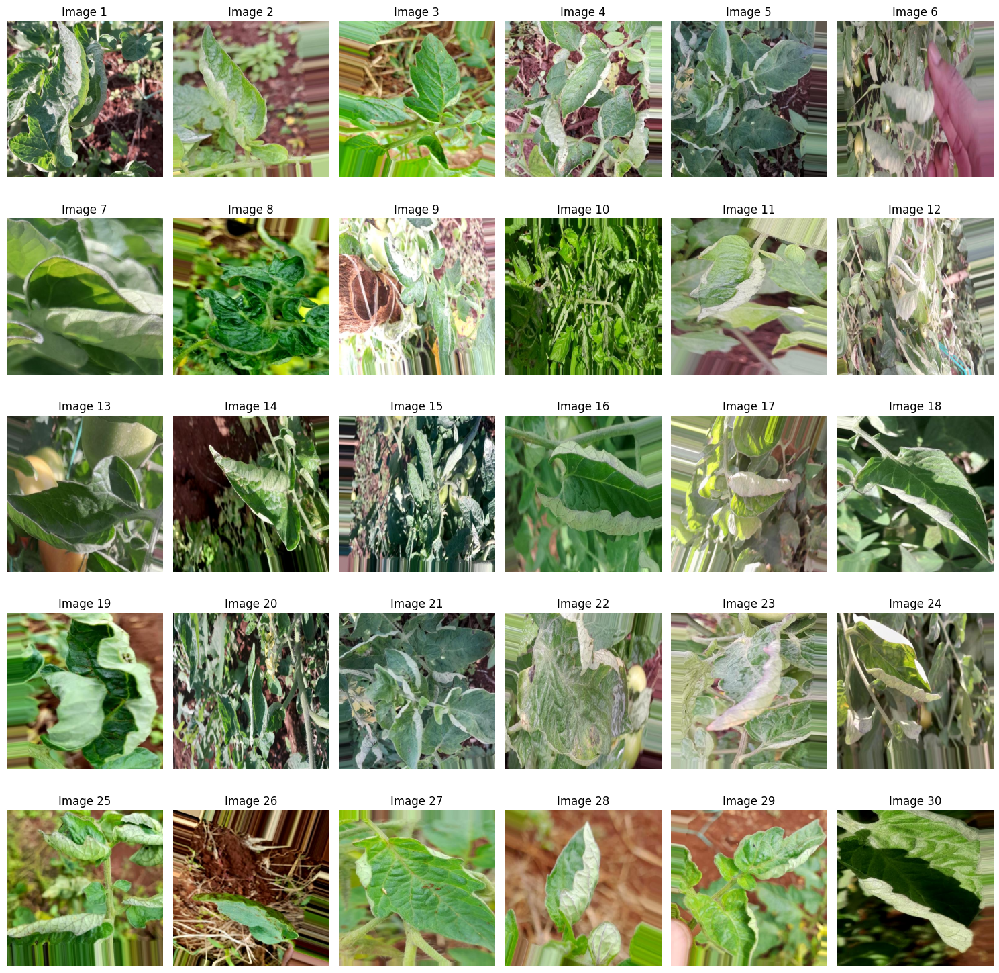

In [15]:
# Displaying some images for Visualization
import os
import matplotlib.pyplot as plt
from PIL import Image

# Specify the path to your folder containing the images
folder_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Curl"

# Get the list of image files in the folder (e.g., files ending with .jpg, .png, etc.)
image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

# Display the first 30 images
num_images = min(30, len(image_files))  # Ensure we don't try to display more images than available
fig, axes = plt.subplots(5, 6, figsize=(15, 15))  # Adjust layout for 5 rows, 6 columns

for i, ax in enumerate(axes.flat):
    if i < num_images:
        # Open the image file
        img_path = os.path.join(folder_path, image_files[i])
        img = Image.open(img_path)

        # Display the image
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Image {i+1}")

plt.tight_layout()
plt.show()


In [16]:
# DATA PREPROCESSING

# Path to the folders containing training and validation data
training_data_path = '/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug'
validation_data_path = '/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug'
test_data_path = '/kaggle/working/TOMATO/TOMATO/TEST SET'
# Defining image size and batch size
IMG_SIZE = (512, 512)
BATCH_SIZE = 32

# Training dataset Preprocessing
training_set = tf.keras.utils.image_dataset_from_directory(
    training_data_path,
    labels="inferred",
    label_mode="categorical",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 18407 files belonging to 6 classes.


In [17]:
# Get a list of all image filenames in the training dataset, including their subdirectory
train_set = [os.path.join(root, filename) for root, _, files in os.walk(training_data_path ) for filename in files if root != training_data_path]

# Extract class names from the filenames
train_class_names= [os.path.basename(os.path.dirname(filename)) for filename in train_set ]

# Count the number of images in each class
train_class_counts = Counter(train_class_names)

# Print the results
for class_name, count in train_class_counts.items():
    print(f"Class: {class_name}, Count: {count}")

Class: Bacterial spot__Blight, Count: 3562
Class: Tomato Leaf Miner Flies, Count: 2675
Class: Tomato Leaf Curl, Count: 3092
Class: Tomato Healthy, Count: 2951
Class: Tobacco Caterpillar, Count: 3117
Class: Not Recognized, Count: 3010


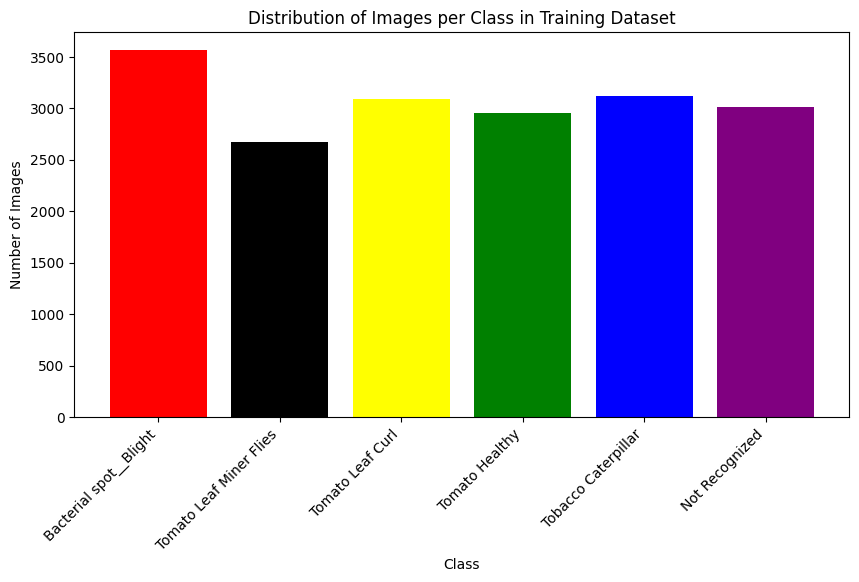

In [18]:
# Visualizing Distribution of the data in training set
# Define the desired colors for each class
train_class_colors = {
    "Tobacco Caterpillar": "blue",
    "Tomato Healthy": "green",
    "Tomato Leaf Curl": "yellow",
    "Tomato Leaf Miner Flies": "black",
    "Bacterial spot__Blight": "red",
    "Not Recognized": "purple",
}

# Get a list of class names
class_names = list(train_class_counts .keys())

# Map the colors to the class names
bar_colors = [train_class_colors[class_name] for class_name in class_names]

# Create the bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_names, list(train_class_counts.values()), color=bar_colors)

# Add labels and title
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha='right')
plt.title("Distribution of Images per Class in Training Dataset")

# Display the bar chart
plt.show()

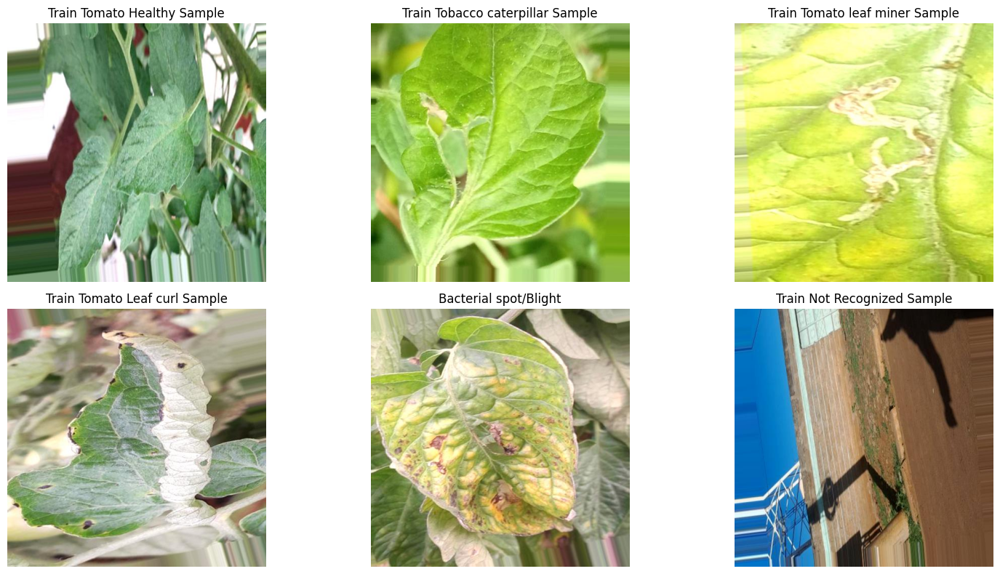

In [19]:
# visualization of training dataset samples
import matplotlib.image as mpimg

def sample_visualization():
    # Paths for Train data
    train_healthy_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Healthy"
    train_tobaccocaterpillar_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tobacco Caterpillar"
    train_leafminer_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Miner Flies"
    train_leafcurl_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Tomato Leaf Curl"
    train_bacterial_blight_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Bacterial spot__Blight"
    train_not_recognized_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/training set aug/Not Recognized"


    train_healthy_sample_path = os.path.join(train_healthy_path, os.listdir(train_healthy_path)[10])
    train_healthy_sample_img = mpimg.imread(train_healthy_sample_path)

    train_tobaccocaterpillar_sample_path = os.path.join(train_tobaccocaterpillar_path, os.listdir(train_tobaccocaterpillar_path)[0])
    train_tobaccocaterpillar_sample_img = mpimg.imread(train_tobaccocaterpillar_sample_path)

    train_leafminer_sample_path = os.path.join(train_leafminer_path, os.listdir(train_leafminer_path)[1])
    train_leafminer_sample_img = mpimg.imread(train_leafminer_sample_path)

    train_leafcurl_sample_path = os.path.join(train_leafcurl_path, os.listdir(train_leafcurl_path)[9])
    train_leafcurl_sample_img = mpimg.imread(train_leafcurl_sample_path)

    train_bacterial_blight_sample_path = os.path.join(train_bacterial_blight_path, os.listdir(train_bacterial_blight_path)[10])
    train_bacterial_blight_sample_img = mpimg.imread(train_bacterial_blight_sample_path)

    train_not_recognized_sample_path = os.path.join(train_not_recognized_path, os.listdir(train_not_recognized_path)[10])
    train_not_recognized_sample_img = mpimg.imread(train_not_recognized_sample_path)


    # Plot side by side
    plt.figure(figsize=(16, 8))

    # Plotting Train data samples
    plt.subplot(2, 3, 1)
    plt.imshow(train_healthy_sample_img)
    plt.title('Train Tomato Healthy Sample')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(train_tobaccocaterpillar_sample_img )
    plt.title('Train Tobacco caterpillar Sample')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(train_leafminer_sample_img )
    plt.title('Train Tomato leaf miner Sample')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(train_leafcurl_sample_img)
    plt.title('Train Tomato Leaf curl Sample')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(train_bacterial_blight_sample_img)
    plt.title('Bacterial spot/Blight')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(train_not_recognized_sample_img)
    plt.title('Train Not Recognized Sample')
    plt.axis('off')


    plt.tight_layout()
    plt.show()

sample_visualization()

In [20]:
# Validation dataset preprocessing
validation_set = tf.keras.utils.image_dataset_from_directory(
    validation_data_path,
    labels="inferred",
    label_mode="categorical",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True
).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 9882 files belonging to 6 classes.


In [21]:
# Get a list of all image filenames in the validation dataset, including their subdirectory
valid_set = [os.path.join(root, filename) for root, _, files in os.walk(validation_data_path ) for filename in files]

# Extract class names from the filenames
valid_class_names= [os.path.basename(os.path.dirname(filename)) for filename in valid_set ]

# Count the number of images in each class
valid_class_counts = Counter(valid_class_names)

# Print the results
for class_name, count in valid_class_counts.items():
    print(f"Class: {class_name}, Count: {count}")

Class: Bacterial spot__Blight, Count: 1858
Class: Tomato Leaf Miner Flies, Count: 1476
Class: Tomato Leaf Curl, Count: 1656
Class: Tomato Healthy, Count: 1595
Class: Tobacco Caterpillar, Count: 1679
Class: Not Recognized, Count: 1618


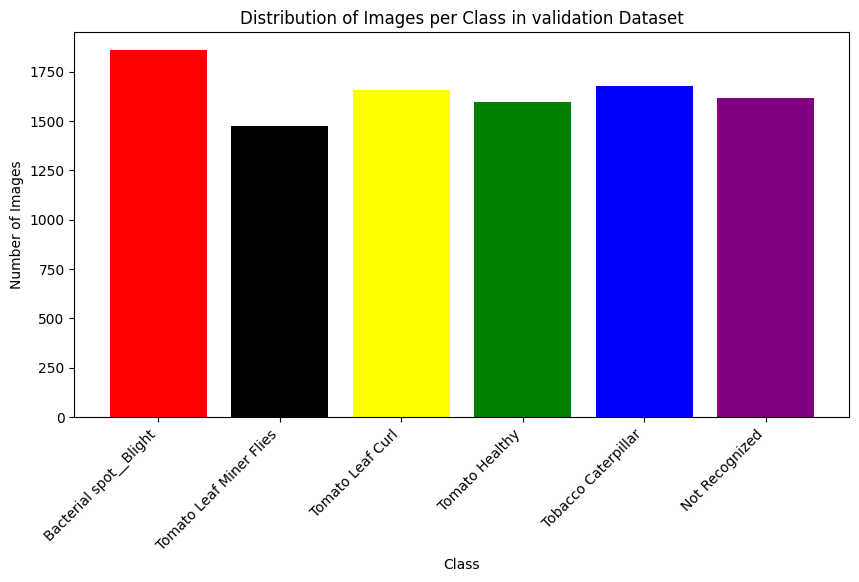

In [22]:

# Define the desired colors for each class
valid_class_colors = {
    "Tobacco Caterpillar": "blue",
    "Tomato Healthy": "green",
    "Tomato Leaf Curl": "yellow",
    "Tomato Leaf Miner Flies": "black",
    "Bacterial spot__Blight": "red",
    "Not Recognized": "purple",
}

# Get a list of class names
class_names = list(valid_class_counts .keys())

# Map the colors to the class names
bar_colors = [valid_class_colors[class_name] for class_name in class_names]

# Create the bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_names, list(valid_class_counts.values()), color=bar_colors)

# Add labels and title
plt.xlabel("Class")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Number of Images")
plt.title("Distribution of Images per Class in validation Dataset")

# Display the bar chart
plt.show()


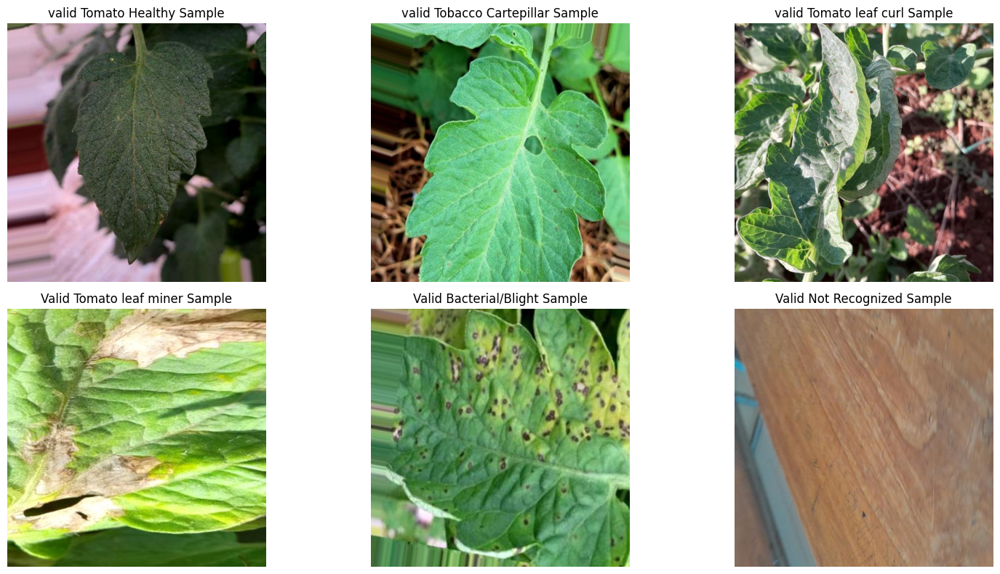

In [23]:
def sample_visualization():
    # Paths for validation data
    valid_healthy_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Healthy"
    valid_tobaccocaterpillar_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tobacco Caterpillar"

    valid_leafcurl_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Curl"
    valid_leafminer_path ="/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Tomato Leaf Miner Flies"

    valid_bacterial_blight_path ="/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Bacterial spot__Blight"
    valid_not_recognized_path = "/kaggle/working/TOMATO/TOMATO/AUGMENTED/validation set aug/Not Recognized"

    valid_healthy_sample_path = os.path.join(valid_healthy_path, os.listdir(valid_healthy_path)[10])
    valid_healthy_sample_img = mpimg.imread(valid_healthy_sample_path)

    valid_tobaccocaterpillar_sample_path = os.path.join(valid_tobaccocaterpillar_path, os.listdir(valid_tobaccocaterpillar_path)[0])
    valid_tobaccocaterpillar_sample_img = mpimg.imread(valid_tobaccocaterpillar_sample_path)

    valid_leafcurl_sample_path = os.path.join(valid_leafcurl_path, os.listdir(valid_leafcurl_path)[0])
    valid_leafcurl_sample_img = mpimg.imread(valid_leafcurl_sample_path)

    valid_leafminer_sample_path = os.path.join(valid_leafminer_path, os.listdir(valid_leafminer_path)[10])
    valid_leafminer_sample_img = mpimg.imread(valid_leafminer_sample_path)

    valid_bacterial_blight_sample_path = os.path.join(valid_bacterial_blight_path, os.listdir(valid_bacterial_blight_path)[10])
    valid_bacterial_blight_sample_img = mpimg.imread(valid_bacterial_blight_sample_path)

    valid_not_recognized_sample_path = os.path.join(valid_not_recognized_path, os.listdir(valid_not_recognized_path)[10])
    valid_not_recognized_sample_img = mpimg.imread(valid_not_recognized_sample_path)


    # Plot side by side
    plt.figure(figsize=(16, 8))

    # Plotting validation data samples
    plt.subplot(2, 3, 1)
    plt.imshow(valid_healthy_sample_img)
    plt.title('valid Tomato Healthy Sample')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(valid_tobaccocaterpillar_sample_img )
    plt.title('valid Tobacco Cartepillar Sample')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(valid_leafcurl_sample_img )
    plt.title('valid Tomato leaf curl Sample')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(valid_leafminer_sample_img)
    plt.title('Valid Tomato leaf miner Sample')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(valid_bacterial_blight_sample_img)
    plt.title('Valid Bacterial/Blight Sample')
    plt.axis('off')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(valid_not_recognized_sample_img)
    plt.title('Valid Not Recognized Sample')
    plt.axis('off')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

sample_visualization()

In [24]:
# Test dataset
test_set = tf.keras.utils.image_dataset_from_directory(
    test_data_path,
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=False,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=True,
    crop_to_aspect_ratio=False,
)
# Prefetch for performance
test_set = test_set.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 384 files belonging to 6 classes.


In [25]:
# Get a list of all image filenames in the test dataset, including their subdirectory
test_set = [os.path.join(root, filename) for root, _, files in os.walk(test_data_path ) for filename in files]

# Extract class names from the filenames
test_class_names= [os.path.basename(os.path.dirname(filename)) for filename in test_set ]

# Count the number of images in each class
test_class_counts = Counter(test_class_names)

# Print the results
for class_name, count in test_class_counts.items():
    print(f"Class: {class_name}, Count: {count}")

Class: Bacterial spot__Blight, Count: 64
Class: Tomato Leaf Miner Flies, Count: 64
Class: Tomato Leaf Curl, Count: 64
Class: Tomato Healthy, Count: 64
Class: Tobacco Caterpillar, Count: 64
Class: Not Recognized, Count: 64


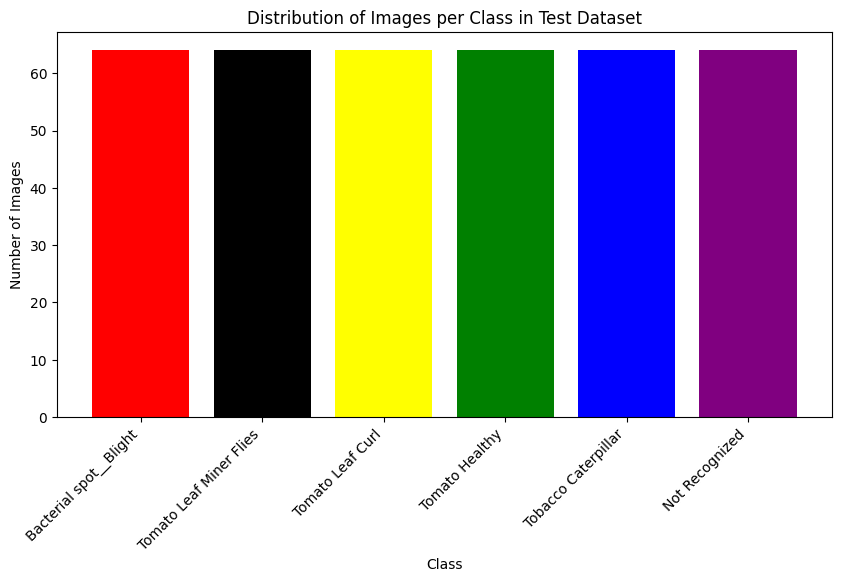

In [26]:
# Define the desired colors for each class
test_class_colors = {
    "Tobacco Caterpillar": "blue",
    "Tomato Healthy": "green",
    "Tomato Leaf Curl": "yellow",
    "Tomato Leaf Miner Flies": "black",
    "Bacterial spot__Blight": "red",
    "Not Recognized": "purple",
}

# Get a list of class names
class_names = list(test_class_counts .keys())

# Map the colors to the class names
bar_colors = [test_class_colors[class_name] for class_name in class_names]

# Create the bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_names, list(test_class_counts.values()), color=bar_colors)

# Add labels and title
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha='right')
plt.title("Distribution of Images per Class in Test Dataset")

# Display the bar chart
plt.show()

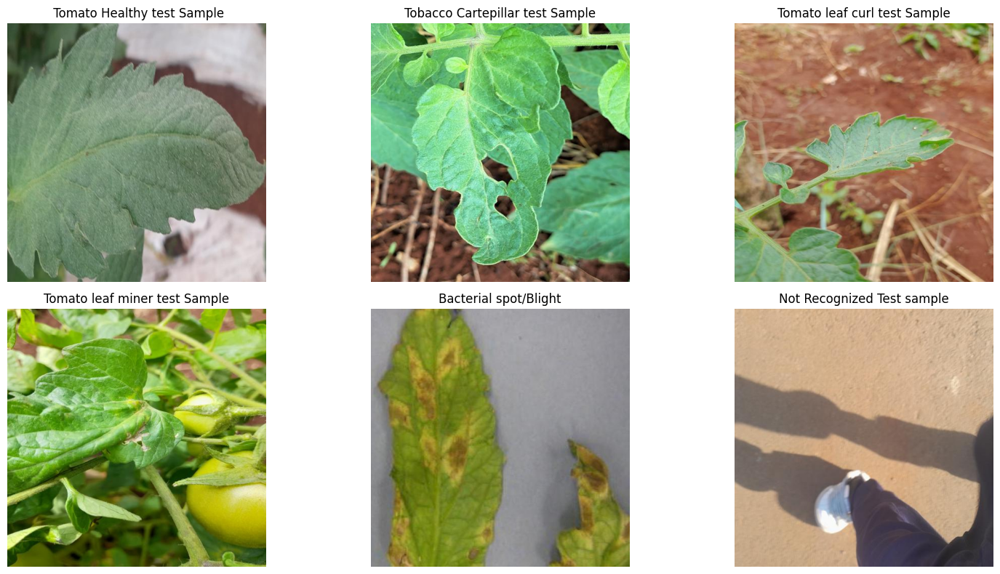

In [27]:
def sample_visualization():
    # Paths for test data
    test_healthy_path = "/kaggle/working/TOMATO/TOMATO/TEST SET/Tomato Healthy"
    test_tobaccocaterpillar_path = "/kaggle/working/TOMATO/TOMATO/TEST SET/Tobacco Caterpillar"

    test_leafcurl_path = "/kaggle/working/TOMATO/TOMATO/TEST SET/Tomato Leaf Curl"
    test_leafminer_path ="/kaggle/working/TOMATO/TOMATO/TEST SET/Tomato Leaf Miner Flies"

    test_bacterial_blight_path ="/kaggle/working/TOMATO/TOMATO/TEST SET/Bacterial spot__Blight"
    test_not_recognized_path ="/kaggle/working/TOMATO/TOMATO/TEST SET/Not Recognized"

    test_healthy_sample_path = os.path.join(test_healthy_path, os.listdir(test_healthy_path)[10])
    test_healthy_sample_img = mpimg.imread(test_healthy_sample_path)

    test_tobaccocaterpillar_sample_path = os.path.join(test_tobaccocaterpillar_path, os.listdir(test_tobaccocaterpillar_path)[11])
    test_tobaccocaterpillar_sample_img = mpimg.imread(test_tobaccocaterpillar_sample_path)

    test_leafcurl_sample_path = os.path.join(test_leafcurl_path, os.listdir(test_leafcurl_path)[8])
    test_leafcurl_sample_img = mpimg.imread(test_leafcurl_sample_path)

    test_leafminer_sample_path = os.path.join(test_leafminer_path, os.listdir(test_leafminer_path)[10])
    test_leafminer_sample_img = mpimg.imread(test_leafminer_sample_path)

    test_bacterial_blight_sample_path = os.path.join(test_bacterial_blight_path, os.listdir(test_bacterial_blight_path)[10])
    test_bacterial_blight_sample_img = mpimg.imread(test_bacterial_blight_sample_path)

    test_not_recognized_sample_path = os.path.join(test_not_recognized_path, os.listdir(test_not_recognized_path)[10])
    test_not_recognized_sample_img = mpimg.imread(test_not_recognized_sample_path)


    # Plot side by side
    plt.figure(figsize=(16, 8))

    # Plotting validation data samples
    plt.subplot(2, 3, 1)
    plt.imshow(test_healthy_sample_img)
    plt.title(' Tomato Healthy test Sample')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(test_tobaccocaterpillar_sample_img )
    plt.title('Tobacco Cartepillar test Sample')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(test_leafcurl_sample_img )
    plt.title('Tomato leaf curl test Sample')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(test_leafminer_sample_img)
    plt.title('Tomato leaf miner test Sample')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(test_bacterial_blight_sample_img)
    plt.title('Bacterial spot/Blight')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(test_not_recognized_sample_img)
    plt.title('Not Recognized Test sample')
    plt.axis('off')

    plt.axis('off')

    plt.tight_layout()
    plt.show()

sample_visualization()

In [28]:
training_set

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>

In [29]:
for x,y in training_set:
  print(x,x.shape)
  print(y,y.shape)
  break

tf.Tensor(
[[[[135. 134.  42.]
   [139. 138.  45.]
   [142. 144.  47.]
   ...
   [140. 174.   0.]
   [139. 173.   0.]
   [139. 173.   0.]]

  [[119. 117.  30.]
   [125. 124.  34.]
   [132. 133.  40.]
   ...
   [141. 175.   0.]
   [140. 174.   0.]
   [140. 174.   0.]]

  [[100.  97.  18.]
   [108. 105.  24.]
   [117. 116.  33.]
   ...
   [143. 177.   2.]
   [142. 176.   1.]
   [141. 175.   0.]]

  ...

  [[ 78. 141.  11.]
   [ 80. 142.  15.]
   [ 79. 141.  16.]
   ...
   [ 97.  43.  15.]
   [ 97.  43.  15.]
   [109.  58.  29.]]

  [[ 75. 137.  10.]
   [ 79. 141.  14.]
   [ 80. 142.  17.]
   ...
   [106.  52.  24.]
   [107.  53.  27.]
   [120.  66.  40.]]

  [[ 70. 132.   5.]
   [ 76. 138.  11.]
   [ 80. 142.  19.]
   ...
   [113.  59.  31.]
   [114.  60.  34.]
   [127.  73.  47.]]]


 [[[243. 253. 252.]
   [243. 253. 252.]
   [243. 253. 252.]
   ...
   [ 48.  89. 121.]
   [ 48.  89. 121.]
   [ 47.  88. 120.]]

  [[244. 254. 253.]
   [244. 254. 253.]
   [244. 254. 253.]
   ...
   [ 48.  

In [30]:
validation_set

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>

In [31]:
for x,y in validation_set:
  print(x,x.shape)
  print(y,y.shape)
  break

tf.Tensor(
[[[[127.  90.  72.]
   [127.  90.  72.]
   [128.  91.  73.]
   ...
   [192. 195. 148.]
   [184. 187. 140.]
   [180. 184. 134.]]

  [[128.  91.  72.]
   [128.  91.  72.]
   [128.  91.  72.]
   ...
   [191. 194. 147.]
   [184. 187. 140.]
   [179. 183. 133.]]

  [[127.  92.  70.]
   [127.  92.  70.]
   [127.  92.  70.]
   ...
   [191. 194. 147.]
   [184. 187. 140.]
   [179. 183. 133.]]

  ...

  [[225. 191. 145.]
   [225. 191. 145.]
   [224. 190. 145.]
   ...
   [172. 207.  77.]
   [172. 207.  77.]
   [172. 207.  77.]]

  [[225. 191. 145.]
   [225. 191. 145.]
   [224. 190. 145.]
   ...
   [172. 207.  77.]
   [172. 207.  77.]
   [172. 207.  77.]]

  [[225. 191. 145.]
   [225. 191. 145.]
   [224. 190. 145.]
   ...
   [172. 207.  77.]
   [172. 207.  77.]
   [172. 207.  77.]]]


 [[[ 76.  35.  33.]
   [ 76.  35.  33.]
   [ 76.  35.  33.]
   ...
   [254. 225. 255.]
   [252. 226. 255.]
   [252. 226. 255.]]

  [[ 76.  35.  33.]
   [ 76.  35.  33.]
   [ 76.  35.  33.]
   ...
   [254. 2

In [32]:
# Building Model
from tensorflow.keras.layers import Conv2D,AveragePooling2D, Dropout, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.regularizers import l2

# Dropouts and kernel regularizer have been used to help with handling overfitting 
def create_model():
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=6, activation='relu', kernel_regularizer=l2(0.0001), input_shape=(512, 512, 3)))
    model.add(AveragePooling2D(pool_size=2, strides=2))

    model.add(Conv2D(filters=64, kernel_size=6, activation='relu', kernel_regularizer=l2(0.0001)))
    model.add(AveragePooling2D(pool_size=2, strides=2))

    model.add(Conv2D(filters=128, kernel_size=6, activation='relu', kernel_regularizer=l2(0.0001)))
    model.add(AveragePooling2D(pool_size=2, strides=2))

    model.add(Conv2D(filters=256, kernel_size=6, activation='relu', kernel_regularizer=l2(0.0001)))
    model.add(AveragePooling2D(pool_size=2, strides=2))
   
    model.add(Dropout(0.5))

    model.add(GlobalAveragePooling2D())

    model.add(Dense(units=1024, activation='relu', kernel_regularizer=l2(0.0001)))

    model.add(Dropout(0.5))

    # Output layer
    model.add(Dense(units=6, activation='softmax')) # Softmax Normalizes output to probability distribution

    return model

In [33]:
# Model Compiling, training and saving
import os

# Callbacks used to handle overfitting
from tensorflow.keras.callbacks import EarlyStopping 
from tensorflow.keras.callbacks import ReduceLROnPlateau
# saves the best model 
from tensorflow.keras.callbacks import ModelCheckpoint

with tpu_strategy.scope():
    # Load data within the TPU scope
    training_set = training_set
    validation_set = validation_set

    # Define and compile the model within the TPU scope
    model = create_model()
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    model.summary()

    # Define EarlyStopping callback
    # Stops training of the model when it does not improve in 15 epoches (Monitors the validation loss)
    early_stopping = EarlyStopping(
    monitor='val_loss',       
    patience=15,               
    restore_best_weights=True 
    )
    
    # Define the ReduceLROnPlateau callback
    # Automatically reduces the learning rate by a factor of 0.5
    # Monitors Validation loss - learning rate is reduced if the metrics fails to improve after 5 epoches
    reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',       
    factor=0.5,               
    patience=5,               
    min_lr=1e-6,              
    verbose=1                 
    )
    
    # Create a ModelCheckpoint callback
    # Path to save the best performing model basing on the validation accuracy(saves the minimum)
    checkpoint_filepath = '/kaggle/working/Tomato_model_best.keras'
    # Checkpoint Callback function
    model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,           
    monitor='val_accuracy',                 
    save_best_only=True,                    
    save_weights_only=False,                
    mode='max',                             
    verbose=1                               
    )

    # Training Function
    # Class Weights 
    # Classes have been assigned weights basing on how the model has been struggling to learn its patterns
    # Most challenging class (leaf miner flies class) assigned the highest weights
    class_weights = {0: 1.0, 1: 1.2, 2: 1.0, 3: 1.0, 4: 7.0, 5:4.5}
    history = model.fit(
        training_set,
        validation_data=validation_set,
        epochs=300,
        batch_size=BATCH_SIZE,
        callbacks=[model_checkpoint, reduce_lr, early_stopping,]
     
    )

    #saving the final state model (A different copy from the best performing model)
    model.save('Tomato_model_final.keras')
    

/usr/local/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1735048322.536234      13 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 507, 507, 32)   │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d               │ (None, 253, 253, 32)   │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 248, 248, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_1             │ (None, 124, 124, 64)   │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 119, 119, 128)  │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_2             │ (None, 59, 59, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 54, 54, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_3             │ (None, 27, 27, 256)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 27, 27, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         6,150 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,821,542 (6.95 MB)

 Trainable params: 1,821,542 (6.95 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/300


2024-12-24 13:52:09.007013: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1735048329.608901     799 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(d5a854378da1eec6:0:0), session_name()


  1/576 ━━━━━━━━━━━━━━━━━━━━ 6:25:48 40s/step - accuracy: 0.5000 - loss: 6.5151

I0000 00:00:1735048367.588194     799 tpu_compile_op_common.cc:245] Compilation of d5a854378da1eec6:0:0 with session name  took 37.979238666s and succeeded
I0000 00:00:1735048367.607971     799 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(d5a854378da1eec6:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_14769703387915724612", property.function_library_fingerprint = 1663557254833179477, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "4,512,512,3,;4,6,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1735048367.608031     799 tpu_compilation_cache_interface.cc:541] After adding entry for key 

575/576 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.2268 - loss: 2.6061

I0000 00:00:1735048410.830463     745 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(25befca2b9f13204:0:0), session_name()


576/576 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.2269 - loss: 2.6049

I0000 00:00:1735048448.988012     745 tpu_compile_op_common.cc:245] Compilation of 25befca2b9f13204:0:0 with session name  took 38.157498811s and succeeded
I0000 00:00:1735048449.005856     745 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(25befca2b9f13204:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_14769703387915724612", property.function_library_fingerprint = 1663557254833179477, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "2,512,512,3,;2,6,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1735048449.005889     745 tpu_compilation_cache_interface.cc:541] After adding entry for key 


Epoch 1: val_accuracy improved from -inf to 0.35518, saving model to /kaggle/working/Tomato_model_best.keras
576/576 ━━━━━━━━━━━━━━━━━━━━ 168s 222ms/step - accuracy: 0.2269 - loss: 2.6036 - val_accuracy: 0.3552 - val_loss: 1.6003 - learning_rate: 0.0010
Epoch 2/300
575/576 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.4092 - loss: 1.5389
Epoch 2: val_accuracy did not improve from 0.35518
576/576 ━━━━━━━━━━━━━━━━━━━━ 60s 104ms/step - accuracy: 0.4092 - loss: 1.5389 - val_accuracy: 0.2864 - val_loss: 1.7359 - learning_rate: 0.0010
Epoch 3/300
575/576 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.2792 - loss: 1.7783
Epoch 3: val_accuracy did not improve from 0.35518
576/576 ━━━━━━━━━━━━━━━━━━━━ 60s 104ms/step - accuracy: 0.2792 - loss: 1.7782 - val_accuracy: 0.3220 - val_loss: 1.6537 - learning_rate: 0.0010
Epoch 4/300
575/576 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.3424 - loss: 1.5900
Epoch 4: val_accuracy improved from 0.35518 to 0.36650, saving model to /kaggle/working/Tom

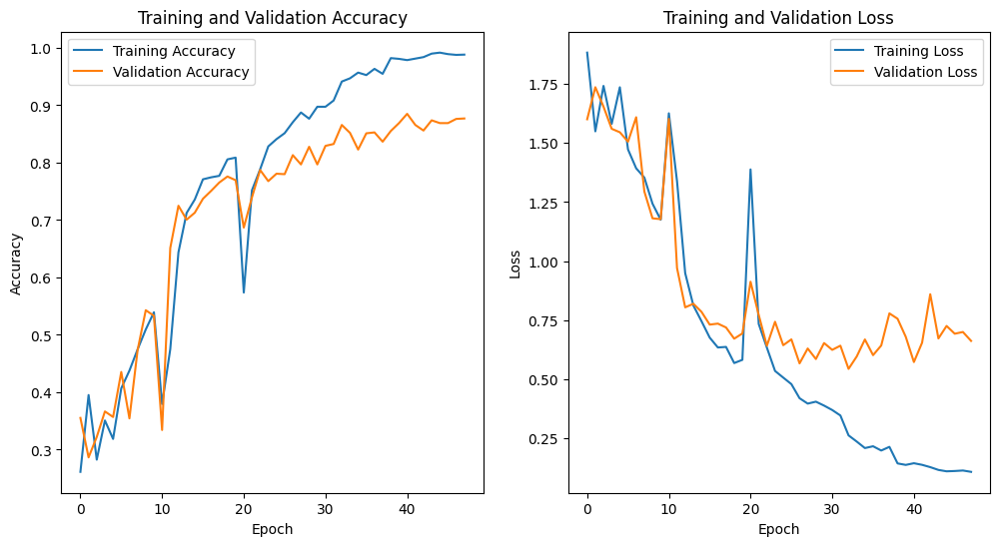

In [34]:
   # Visualize training on Curves
   # Plots the graphs of both accuracies and losses on training and validation datasets

   #To plot the Accuracy curves
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

   # To plot the Loss curves
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

   # Show the plots
plt.show()

In [35]:
  # Evaluating the final state model on training and validation datasets

  #On Train data
train_loss,train_acc=model.evaluate(training_set)
print("Train Loss:",train_loss)
print("Train Accuracy:",train_acc)

  # On Validation data
val_loss,val_acc=model.evaluate(validation_set)
print("Validation Loss:",val_loss)
print("Validation Accuracy:",val_acc)

2024-12-24 14:45:35.226079: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node Add/ReadVariableOp.


575/576 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9549 - loss: 0.1927

I0000 00:00:1735051570.247847     832 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(7cbf2aeb500c88a9:0:0), session_name()


576/576 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.9550 - loss: 0.1926


I0000 00:00:1735051579.399214     832 tpu_compile_op_common.cc:245] Compilation of 7cbf2aeb500c88a9:0:0 with session name  took 9.151287676s and succeeded
I0000 00:00:1735051579.401696     832 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(7cbf2aeb500c88a9:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_14579681445095771626", property.function_library_fingerprint = 2664690447184911059, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "2,512,512,3,;2,6,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1735051579.401740     832 tpu_compilation_cache_interface.cc:541] After adding entry for key 7

Train Loss: 0.17653398215770721
Train Accuracy: 0.9682746529579163
309/309 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - accuracy: 0.8596 - loss: 0.6025
Validation Loss: 0.5917770266532898
Validation Accuracy: 0.8519417643547058


In [36]:
  # Preprocessing Test dataset
test_set = tf.keras.utils.image_dataset_from_directory(
    test_data_path,
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=False,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
)


# Print class names with indices
for index, class_name in enumerate(class_names):
    print(f"Class {index}: {class_name}")

print(class_names)

Found 384 files belonging to 6 classes.
Class 0: Bacterial spot__Blight
Class 1: Tomato Leaf Miner Flies
Class 2: Tomato Leaf Curl
Class 3: Tomato Healthy
Class 4: Tobacco Caterpillar
Class 5: Not Recognized
['Bacterial spot__Blight', 'Tomato Leaf Miner Flies', 'Tomato Leaf Curl', 'Tomato Healthy', 'Tobacco Caterpillar', 'Not Recognized']


In [37]:
# Evaluating the best model saved and the final state model on test data
from tensorflow.keras.models import load_model

# Loading the models
best_model = load_model('/kaggle/working/Tomato_model_best.keras') # best model
final_model = load_model('/kaggle/working/Tomato_model_final.keras') #final state model

# Evaluating the model on the test data
loss1, accuracy1 = best_model.evaluate(test_set)
loss2, accuracy2 = final_model.evaluate(test_set)

print(f"Test Loss(best model): {loss1}")
print(f"Test Accuracy(best model): {accuracy1}")
print(f"Test Loss(final state model): {loss2}")
print(f"Test Accuracy(final state model): {accuracy2}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 765ms/step - accuracy: 0.9353 - loss: 0.4141
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 780ms/step - accuracy: 0.9321 - loss: 0.3660
Test Loss(best model): 0.5062268972396851
Test Accuracy(best model): 0.9140625
Test Loss(final state model): 0.4593794047832489
Test Accuracy(final state model): 0.9036458134651184


In [38]:
# Converting the test data to numpy array
import numpy as np

# Initialize lists to store images and labels
images = []
labels = []

# Extract images and labels
for batch_images, batch_labels in test_set:
    images.extend(batch_images)
    labels.extend(batch_labels)

# Convert to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Ensure images have a batch size shape by reshaping if necessary
if len(images) % 32 != 0:  
    images = images[:len(images)// 32 * 32]
    labels = labels[:len(labels)// 32 * 32]

# Running predictions using both models
y_pred_final = final_model.predict(images)

y_pred_best = best_model.predict(images)

print("Predictions shape for final state model:", y_pred_final.shape)

print("Predictions shape for best model saved by checkpoint function:", y_pred_best.shape)


12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 758ms/step
12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 761ms/step
Predictions shape for final state model: (384, 6)
Predictions shape for best model saved by checkpoint function: (384, 6)


In [39]:
# for best model
predicted_categories1 = tf.argmax(y_pred_best, axis=1)
predicted_categories1

# for final state model
predicted_categories2 = tf.argmax(y_pred_final, axis=1)
predicted_categories2

<tf.Tensor: shape=(384,), dtype=int64, numpy=
array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       3, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 3, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 4, 2, 2, 4,
       4, 2, 2, 2, 2, 5, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 5, 4, 4, 4, 5, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
     

In [40]:
# Prefetch data for faster retrieval
# For best model
true_categories1 = tf.concat([y for x, y in test_set], axis=0)
y_true_best = tf.argmax(true_categories1, axis=1) 
y_true_best

#for final state model
true_categories2 = tf.concat([y for x, y in test_set], axis=0)
y_true_final = tf.argmax(true_categories2, axis=1) 
y_true_final

<tf.Tensor: shape=(384,), dtype=int64, numpy=
array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
     

In [41]:

class_name = test_set.class_names
class_name
print(class_names)


['Bacterial spot__Blight', 'Tomato Leaf Miner Flies', 'Tomato Leaf Curl', 'Tomato Healthy', 'Tobacco Caterpillar', 'Not Recognized']


CLASSIFICATION REPORT FOR BEST MODEL
                         precision    recall  f1-score   support

 Bacterial spot__Blight       0.92      0.91      0.91        64
         Not Recognized       0.97      1.00      0.98        64
    Tobacco Caterpillar       0.84      0.89      0.86        64
         Tomato Healthy       0.97      0.98      0.98        64
       Tomato Leaf Curl       0.90      0.94      0.92        64
Tomato Leaf Miner Flies       0.89      0.77      0.82        64

               accuracy                           0.91       384
              macro avg       0.91      0.91      0.91       384
           weighted avg       0.91      0.91      0.91       384

12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 763ms/step


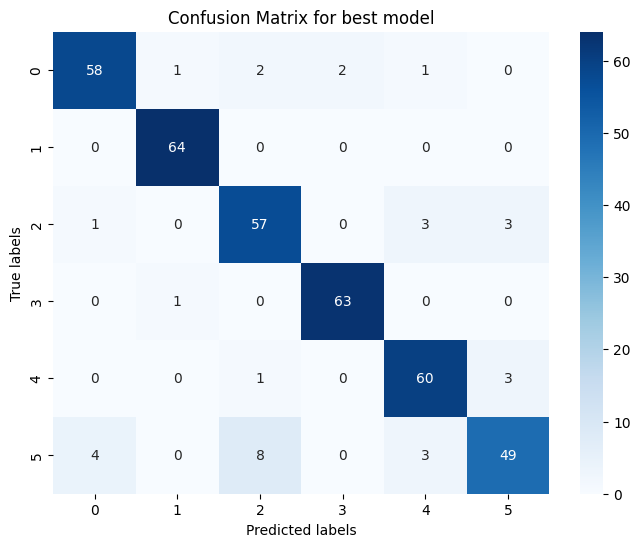

CLASSIFICATION REPORT FOR FINAL STATE MODEL
                         precision    recall  f1-score   support

 Bacterial spot__Blight       0.92      0.91      0.91        64
         Not Recognized       0.96      1.00      0.98        64
    Tobacco Caterpillar       0.84      0.89      0.86        64
         Tomato Healthy       0.97      0.98      0.98        64
       Tomato Leaf Curl       0.89      0.91      0.90        64
Tomato Leaf Miner Flies       0.84      0.73      0.78        64

               accuracy                           0.90       384
              macro avg       0.90      0.90      0.90       384
           weighted avg       0.90      0.90      0.90       384

12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 759ms/step


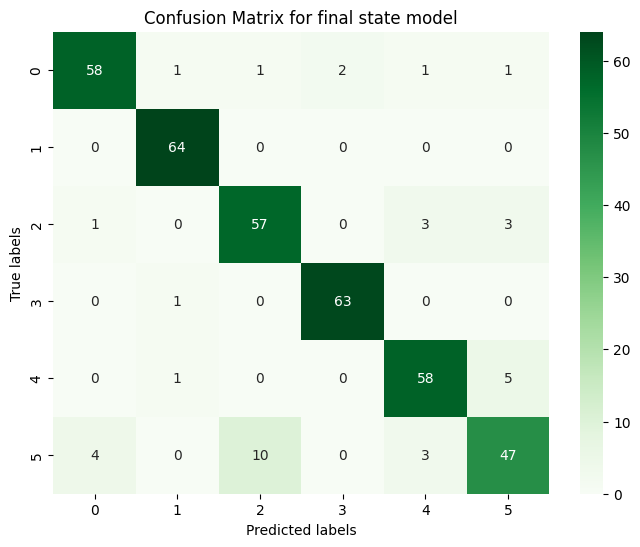

In [42]:
# THE CLASSIFICATION REPORTS and CONFUSION MATRICES
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# For best model
print("CLASSIFICATION REPORT FOR BEST MODEL")
print(classification_report(y_true_best, predicted_categories1, target_names= class_name))

# Use the images and labels arrays created earlier
y_pred_best_probs = best_model.predict(images)  # Use the numpy array of images directly
y_pred_best = np.argmax(y_pred_best_probs, axis=1)
# True labels were already converted to numpy array format earlier
y_true_best = labels.argmax(axis=1)  # Assuming one-hot encoded labels
# Generate the confusion matrix
cm = confusion_matrix(y_true_best, y_pred_best)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for best model')
plt.show()

# for final state model
print("CLASSIFICATION REPORT FOR FINAL STATE MODEL")
print(classification_report(y_true_final, predicted_categories2, target_names= class_name))

# Use the images and labels arrays created earlier
y_pred_final_probs = final_model.predict(images)  # Use the numpy array of images directly
y_pred_final = np.argmax(y_pred_final_probs, axis=1)
# True labels were already converted to numpy array format earlier
y_true_final = labels.argmax(axis=1)  # Assuming one-hot encoded labels
# Generate the confusion matrix
cm = confusion_matrix(y_true_final, y_pred_final)
# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Greens')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for final state model')
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


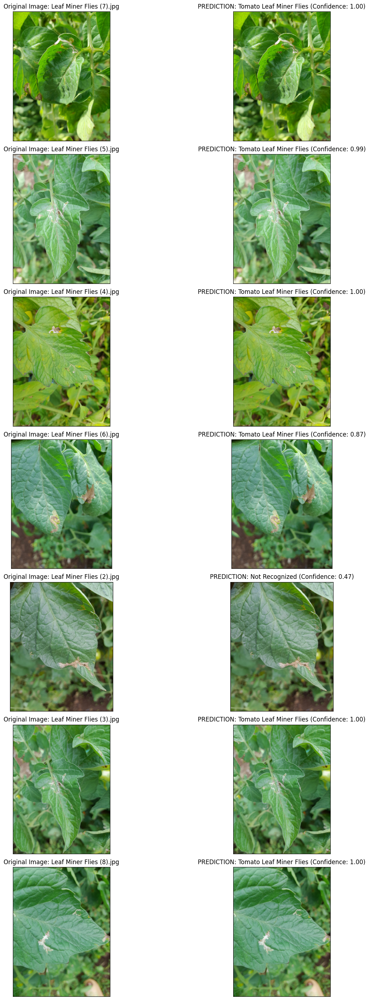

In [46]:
# TESTING BEST MODEL
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt


# LOADING MODEL
model= tf.keras.models.load_model('/kaggle/working/Tomato_model_best.keras')

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Folder containing the test images
eights_path = "/kaggle/working/TOMATO/TOMATO/8s/Leaf miner"  
# Class names
class_name = class_name

# Confidence threshold for "Not Recognized"
CONFIDENCE_THRESHOLD = 0.6  # (60%)

# DEFINING PREDICTION FUNCTION
def predict_images_in_folder(eights_path, class_name, model):

    # List all files in the folder
    image_files = [f for f in os.listdir(eights_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        print("No images found in the specified folder.")
        return

    plt.figure(figsize=(16, len(image_files) * 4))

    for i, file_name in enumerate(image_files):
        image_path = os.path.join(eights_path, file_name)
        
        # Read the image
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper display

        # Load and process the image
        image = load_img(image_path, target_size=IMG_SIZE , color_mode="rgb", interpolation="lanczos")
        input_arr = np.array([np.array(image)])  # Add batch dimension

        # Prediction
        prediction = model.predict(input_arr)
        result_index = np.argmax(prediction)
        confidence = prediction[0][result_index]
        
        # Determine the predicted label or "Not Recognized"
        if confidence >= CONFIDENCE_THRESHOLD:
            model_prediction = class_name[result_index]
        else:
            model_prediction = "Not Recognized"


        # Display the image and prediction
        plt.subplot(len(image_files), 2, i * 2 + 1)
        plt.imshow(img_rgb)
        plt.title(f"Original Image: {file_name}")
        plt.xticks([])
        plt.yticks([])

        plt.subplot(len(image_files), 2, i * 2 + 2)
        plt.imshow(img_rgb)
        plt.title(f"PREDICTION: {model_prediction} (Confidence: {confidence:.2f})")
        plt.xticks([])
        plt.yticks([])

    plt.tight_layout()
    plt.show()

# Calling the predict function
predict_images_in_folder(eights_path, class_name, model)
